In [10]:
from sklearn.datasets import load_iris
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import make_scorer, accuracy_score

In [11]:
data = load_iris()
X = data.data
y = data.target
y_binary = np.where(y==1,1,-1)

np.random.seed(42)
indices = np.random.permutation(len(X))
X, y_binary = X[indices], y_binary[indices]


X_train,X_test,y_train,y_test = train_test_split(X,y_binary,test_size=0.3,random_state=42)
# X_train

In [12]:
class RBFNetwork(object):
    def __init__(self,epsilon=0.5, v0=None):
        print("DEBUG: this is init")
        # 初始化RBF网络参数
        # self.rho = None      # 输入相似度阈值
        self.epsilon = epsilon  # 输出相似度阈值
        self.v0 = v0 if v0 is not None else 0
        self.centers = []    # 存储聚类中心
        self.variances = []  # 存储每个聚类的方差
        self.weights = None  # 存储输出层的权重
        self.cluster_labels = []

    def set_v0(self, X):
        """基于输入数据X自动计算v0值"""
        # 计算X每个维度的方差
        feature_variances = np.var(X, axis=0)  # 计算每个特征的方差
        # feature_variances = np.std(X, axis=0) # 计算每个特征的标准差
        # print(f"feature_variances is {feature_variances}")
        self.v0 = np.max(feature_variances)  # 使用方差的均值作为v0的初始值
     
        # print(f"Dynamic v0 set to: {self.v0}")  # 输出动态设置的 v08    

    def _input_similarity(self, x, center,variance):
        # print("DEBUG: this is _input_similarity")
        # 计算输入样本x与聚类中心的相似度
        similarity = np.exp(-np.linalg.norm(x - center) ** 2 / (2 * variance ** 2))
        # print(f"_input_similarity -> x: {x}, center: {center}, variance :{variance} ,similarity: {similarity}")
        return similarity

    def _output_similarity(self, y, cluster_y):
        print("DEBUG: this is _output_similarity")
        # 计算输出样本y与聚类输出的相似度
        # similarity = np.sum(np.minimum(y, cluster_y)) / np.sum(np.maximum(y, cluster_y))
        if y == cluster_y:
            similarity = 1
        else:
            similarity = 0
        print(f"_output_similarity -> y: {y}, cluster_y: {cluster_y}, similarity: {similarity}")
        return similarity

    def _add_cluster(self, x, y):
        print("DEBUG: this is _add_cluster")
        # 如果没有找到合适的聚类，则创建新聚类
        self.centers.append(x)  # 新聚类中心为当前样本
        self.variances.append(self.v0)  # 初始化方差
        self.cluster_labels.append(y)
        print(f"_add_cluster -> New center added: {x}, cluster_label: {y},variance: {self.variances[-1]}")
        return y

    def _update_cluster(self, x, y, cluster_idx):
        print("DEBUG: this is _update_cluster")
        # 更新已有聚类的中心和方差
        n = len(self.centers[cluster_idx])  # 当前聚类中样本数量
        old_center = self.centers[cluster_idx]
        old_variance = self.variances[cluster_idx]
        
        # 更新聚类中心
        self.centers[cluster_idx] = (n * self.centers[cluster_idx] + x) / (n + 1)
        # 更新方差
        self.variances[cluster_idx] = np.sqrt(((self.variances[cluster_idx]**2) * n + np.linalg.norm(x - self.centers[cluster_idx])**2) / (n + 1))
        
        print(f"_update_cluster -> Old center: {old_center}, New center: {self.centers[cluster_idx]}")
        print(f"_update_cluster -> Old variance: {old_variance}, New variance: {self.variances[cluster_idx]}")

    def compute_similarity_scores(self, X):
        # Compute pairwise similarity scores for the data points in X
        similarity_matrix = np.zeros((len(X), len(X)))
        
        for i in range(len(X)):
            for j in range(i, len(X)):
                similarity_matrix[i, j] = self._input_similarity(X[i], X[j], self.v0)
                similarity_matrix[j, i] = similarity_matrix[i, j]  # Symmetric matrix
        # print(similarity_matrix)
        return similarity_matrix

    def determine_rho_range(self,X):
        print("DEBUG: this is determine_rho_range")
        similarity_matrix = self.compute_similarity_scores(X)
        # Flatten the upper triangular part of the matrix to avoid duplicate comparisons
        upper_triangular = similarity_matrix[np.triu_indices_from(similarity_matrix, k=1)]
        # print(upper_triangular)
        # Calculate the 10th and 90th percentiles of the similarity scores
        rho_min = np.percentile(upper_triangular, 10)
        rho_max = np.percentile(upper_triangular, 90)
        # print(max(upper_triangular))
        # print(min(upper_triangular))
        # print(rho_max)
        # print(rho_min)
        return rho_min, rho_max

    def reset_params(self):
        self.v0 = 0        # 初始偏差值
        self.centers = []    # 存储聚类中心
        self.variances = []  # 存储每个聚类的方差
        self.weights = None  # 存储输出层的权重
        self.cluster_labels = [] 

    def fit(self, X, y):
        print("DEBUG: this is fit")
        self.set_v0(X)

        # Determine range for rho and create grid of rho values
        rho_min, rho_max = self.determine_rho_range(X)
        rho_values = np.linspace(rho_min, rho_max, num=10)
        best_rho = None
        best_accuracy = 0

        # Grid search over rho values
        for rho in rho_values:
            self.rho = rho
            # print(f'rho = {self.rho}')
            fold_accuracies = []
            
            # Train and validate model on each rho
            kf = KFold(n_splits=10, shuffle=True, random_state=42)
            for fold_num, (train_index, val_index) in enumerate(kf.split(X)):
                # print(f"Fold {fold_num+1}:")
                # print(f"train_index: {train_index}")
                # print(f"val_index: {val_index}")
                
                X_train, X_val = X[train_index], X[val_index]
                y_train, y_val = y[train_index], y[val_index]

                # Reset model parameters before each fold
                self.reset_params()
                self.set_v0(X) # also can be set to X_train
                
                self.fit_clusters(X_train, y_train)
                y_pred = self.predict(X_val)[0]
                accuracy = accuracy_score(y_val, y_pred)
                fold_accuracies.append(accuracy)
                # print(f'Accuracy: {accuracy}' )
                
            avg_accuracy = np.mean(fold_accuracies)
            # print(f'Ave Accuracy: {avg_accuracy}')
            if avg_accuracy > best_accuracy:
                best_accuracy = avg_accuracy
                best_rho = rho

        self.rho = best_rho
        # print(f"Selected best rho: {self.rho}")

        # Final model training with the best rho
        self.fit_clusters(X, y)

    def fit_clusters(self, X, y):
        print(f"Debug: this is fit_clusters")
        # 训练RBF网络
        # self.rho = self.cross_validate(X, y)  # Set the best rho
        

        if not self.centers:
            self.centers.append(X[0])
            self.variances.append(self.v0)
            self.cluster_labels.append(y[0])
            print((f"the first cluster -> centers {X[0]}, cluster_labels: {y[0]}"))

        for i, x in enumerate(X):
            max_input_sim, best_cluster = -1, -1
            print(f"fit -> Processing sample {i}, x: {x}, y: {y[i]}")
            
            # 查找最佳聚类
            for idx, center in enumerate(self.centers):
                # print(f"debug: the length of centers is {len(self.centers)}")
                # print(f"debug: the length of cluster_labels is {len(self.cluster_labels)}")
                # print(f"debug: the idex  is {idx} ")
                input_sim = self._input_similarity(x, center, self.variances[idx])  # 输入相似度
                output_sim = self._output_similarity(y[i], self.cluster_labels[idx])  # 输出相似度
                # best_rho = self.cross_validate(X,y,k=5)
                # 如果相似度超过阈值，则更新最佳聚类
                print(f"fit -> Cluster {idx}: input_sim: {input_sim}, output_sim: {output_sim}")
                # print(f"in the fit(), the  is {best_rho}")
                if input_sim >= self.rho and output_sim == 1:
                    if input_sim > max_input_sim:
                        max_input_sim, best_cluster = input_sim, idx
                        # print(f"fit -> Updated best cluster to {best_cluster} with input_sim: {max_input_sim}")

            # 如果没有找到合适的聚类，则创建新聚类
            if best_cluster == -1:
                self._add_cluster(x, y[i])
                # print(f"fit -> Created new cluster for sample {i}")
            else:
                self._update_cluster(x, y[i], best_cluster)
                # print(f"fit -> Updated cluster {best_cluster} for sample {i}")

        # 计算隐藏层输出并优化权重
        # print("--------Calculating hidden layer output--------")
        hidden_layer_output = np.array([
            [self._input_similarity(x, center,variance) for center ,variance,in zip(self.centers,self.variances)]
            for x in X
        ])
        # print(f"fit -> Hidden layer output matrix:\n{hidden_layer_output}")
        
        # 使用伪逆计算输出层的权重
        self.weights = np.linalg.pinv(hidden_layer_output) @ y
        # print(f"fit -> Calculated weights: {self.weights}")

    def softmax(self,x):
        exp_x = np.exp(x)
        return exp_x/np.sum(exp_x)

    def predict(self, X):
        # print(f"Debug: this is predict")
        # 使用训练好的模型进行预测
        hidden_layer_output = np.array([
            [self._input_similarity(x, center,variance) for center ,variance,in zip(self.centers,self.variances)]
            for x in X
        ])
        raw_output = hidden_layer_output @ self.weights
        # print(f"predict -> Hidden layer output for predictions:\n{hidden_layer_output}")
        # print(f"{prt}]")
        """ plt.hist(prt,bins=10,color='red',alpha=0.6,label = 'prt distribution')
        plt.show() """
        # 输出大于0.5的预测为1（YES），否则为-1（NO）
        # print(hidden_layer_output @ self.weights)
        predictions = np.where(hidden_layer_output @ self.weights >= 0, 1, -1)
        # print(f"predict -> Predictions: {predictions}")
        
        percentages = self.softmax(raw_output)
        return predictions,percentages
    
    def single_predict(self, x):
        print(f"Debug: this is single_predict")
       
        # 使用训练好的模型进行预测
        hidden_layer_output = [self._input_similarity(x, center,variance) for center ,variance,in zip(self.centers,self.variances)]
        # print(f"predict -> Hidden layer output for predictions:\n{hidden_layer_output}")
        # 输出大于0.5的预测为1（YES），否则为-1（NO）
        raw_output = hidden_layer_output @ self.weights
        prediction = 1 if raw_output >= 0 else -1
        # print(f"predict -> Predictions: {predictions}")
        print(f"raw_output -> {raw_output}")
        """  
       if prediction == 1:
            print(f"raw_output -> raw_output: {raw_output}")
            percentage = self.softmax(raw_output)
            print(f"percentage sofmax: {percentage}")
            
        else:
            percentage = 0 
        """
        # print(f"percentages -> percentages: {percentages}")
        # print(f"predict -> percentage: {percentage}")
        return prediction,raw_output
   

In [13]:
rbf = RBFNetwork()
rbf.fit(X_train,y_train)

y_predictions,y_percentages = rbf.predict(X_test)
accuracy = accuracy_score(y_test,y_predictions)
print(f"rbf.centers are {rbf.centers}")
print(f"rbf.cluster_labels.{rbf.cluster_labels}")
print(f"y_test is {y_test}")
print(f"y_predictions is {y_predictions}")
print(f"y_percentages is {y_percentages}")
print(f"accuracy is {accuracy}")

DEBUG: this is init
DEBUG: this is fit
DEBUG: this is determine_rho_range
Debug: this is fit_clusters
the first cluster -> centers [6.7 3.1 5.6 2.4], cluster_labels: -1
fit -> Processing sample 0, x: [6.7 3.1 5.6 2.4], y: -1
DEBUG: this is _output_similarity
_output_similarity -> y: -1, cluster_y: -1, similarity: 1
fit -> Cluster 0: input_sim: 1.0, output_sim: 1
DEBUG: this is _update_cluster
_update_cluster -> Old center: [6.7 3.1 5.6 2.4], New center: [6.7 3.1 5.6 2.4]
_update_cluster -> Old variance: 3.126336507936509, New variance: 2.7962803809141383
fit -> Processing sample 1, x: [6.3 2.9 5.6 1.8], y: -1
DEBUG: this is _output_similarity
_output_similarity -> y: -1, cluster_y: -1, similarity: 1
fit -> Cluster 0: input_sim: 0.9648242067865392, output_sim: 1
DEBUG: this is _update_cluster
_update_cluster -> Old center: [6.7 3.1 5.6 2.4], New center: [6.62 3.06 5.6  2.28]
_update_cluster -> Old variance: 2.7962803809141383, New variance: 2.515358259761073
fit -> Processing sample 2, 

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.decomposition import PCA

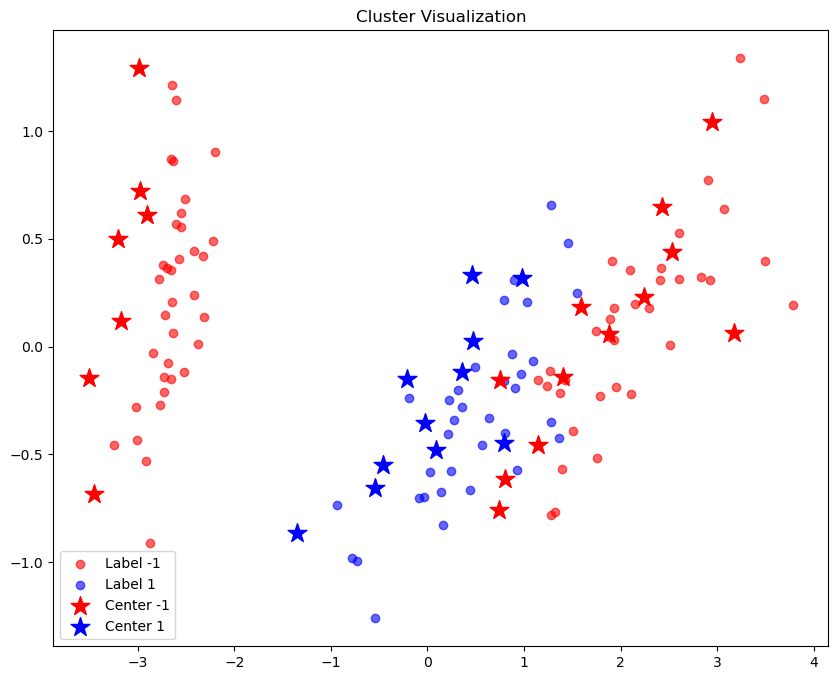

In [17]:
def plot_clusters(X, y, centers,cluster_labels, predictions=None, plot_centers=True):
    # Scatter plot for the actual data points
    plt.figure(figsize=(10, 8))
    pca = PCA(n_components=2)
    X_reduce = pca.fit_transform(X)
    # print(X_reduce)
    
    # Define colors for the clusters (based on actual labels or predictions)
    unique_labels = np.unique(y)
    cluster_colors = ['red', 'blue', 'green', 'orange', 'purple']  # Extend if needed
    
    for i, label in enumerate(unique_labels):
        plt.scatter(X_reduce[y == label, 0],
                    X_reduce[y == label, 1], 
                    label=f"Label {label}", 
                    color=cluster_colors[i], 
                    alpha=0.6)

    if predictions is not None:
        for i, label in enumerate(np.unique(predictions)):
            plt.scatter(X_reduce[predictions == label, 0], 
                        X_reduce[predictions == label, 1], 
                        marker='x', label=f"Predicted {label}", 
                        color=cluster_colors[i], 
                        alpha=0.6)
    
    # Plot the centers of the clusters (for both actual and predicted clusters)
    unique_center_labels = np.unique(cluster_labels)
    if plot_centers:
        centers = np.array(centers)
        centers_reduce = pca.fit_transform(centers)
        for i, label in enumerate(unique_center_labels):
            plt.scatter(centers_reduce[cluster_labels == label, 0],
                        centers_reduce[cluster_labels  == label, 1], 
                        label=f"Center {label}", 
                        color=cluster_colors[i], 
                        marker='*',
                        s=200)



    plt.title("Cluster Visualization")
    plt.legend()
    plt.show()

plot_clusters(X_train, y_train, rbf.centers,rbf.cluster_labels)

[[-3.20869398  0.49916765]
 [ 1.58964088  0.18236956]
 [ 1.40578001 -0.14289762]
 [-0.03045041 -0.35556012]
 [ 0.35739024 -0.11693619]
 [-3.50699005 -0.14804508]
 [ 2.94935273  1.04369976]
 [ 0.80059082 -0.61305645]
 [-2.97509747  0.72143166]
 [ 2.53488726  0.43723483]
 [-0.45546726 -0.54782715]
 [-3.174538    0.11674649]
 [ 0.978657    0.32046507]
 [ 1.14587289 -0.45713363]
 [ 2.42555609  0.64837999]
 [ 0.73890808 -0.75754564]
 [ 0.47225367  0.02384789]
 [-0.54149674 -0.65867194]
 [ 0.75114199 -0.15580719]
 [ 3.17154996  0.06481307]
 [ 2.24519342  0.23053709]
 [-2.98365317  1.29358515]
 [-1.35134613 -0.86449147]
 [-2.89847468  0.60830524]
 [ 0.46394512  0.33274133]
 [ 1.88369702  0.06058081]
 [ 0.08695732 -0.48016789]
 [-0.21099566 -0.15282709]
 [-3.45678592 -0.68547009]
 [ 0.79261499 -0.44746806]]


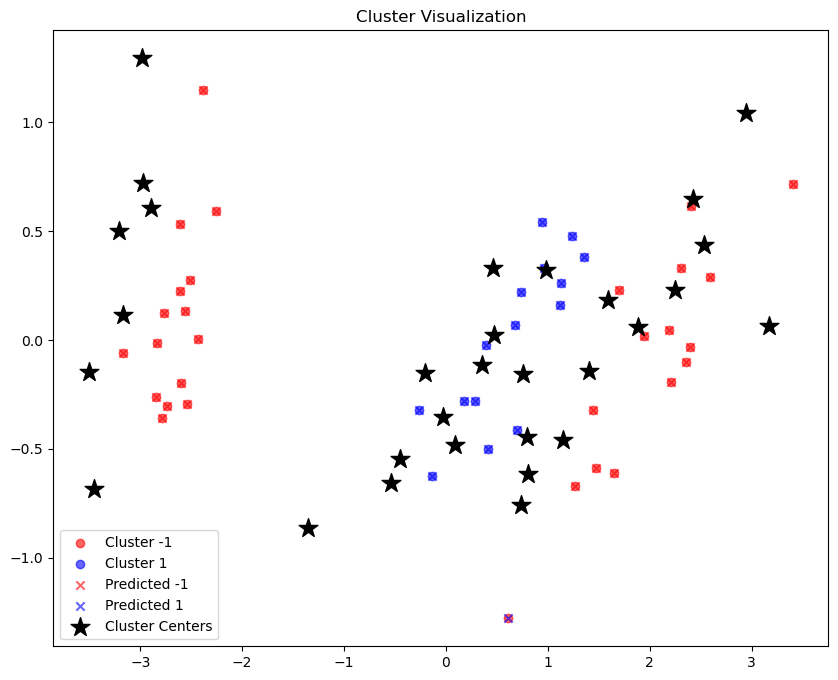

In [57]:
plot_clusters(X_test, y_test, rbf.centers,rbf.cluster_labels, predictions=y_predictions)

In [48]:
def plot_decision_boundary(X, y, model, title="Decision Boundary"):
    # 创建网格，范围是数据的最小和最大值
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))

    # 使用模型预测网格点的结果
    Z, _ = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.75, cmap=plt.cm.coolwarm)
    
    # 绘制实际数据点
    plt.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k', cmap=plt.cm.coolwarm)
    plt.title(title)
    plt.show()

# Visualize decision boundary on the training set
plot_decision_boundary(X_train, y_train, rbf)

# Visualize decision boundary on the test set
plot_decision_boundary(X_test, y_test, rbf)


ValueError: operands could not be broadcast together with shapes (2,) (4,) 